# Celebrity Face Generation
Use generative adversarial networks to generate new images of faces.
### Get the Data

Dataset
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)

In [17]:
# Create a data folder in the home directory, download the data from above location, unzip the attached celebrity images in it.

data_dir = './data'


## Helper class contains functions to maintain the abstraction

These functions are created to keep actual GAN logic visible otherwise it will be messy.

## Explore the Data
### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

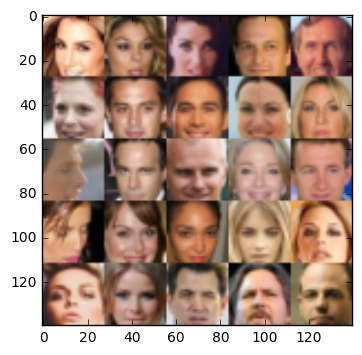

In [28]:
show_n_images = 25


%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot
import helper
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

celeb_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(celeb_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
The components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [19]:

def model_inputs(image_width, image_height, image_channels, z_dim):
   
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, (None))
    
    return inputs_real, inputs_z, learning_rate


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [20]:
def discriminator(images, reuse=False):
   
    alpha=0.2
    x = images
    
    with tf.variable_scope('discriminator', reuse=reuse):
        x = tf.layers.conv2d(x, 64, 4, strides=2, padding="same")
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)

        x = tf.layers.conv2d(x, 128, 4, strides=2, padding="same")
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)

        x = tf.layers.conv2d(x, 256, 4, strides=2, padding="same")
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)

        x = tf.reshape(x, (-1, 4*4*256))
        logits = tf.layers.dense(x, 1)
        out = tf.sigmoid(logits)

    return out, logits


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [21]:
def generator(z, out_channel_dim, is_train=True):
    
    reuse = not is_train
    alpha=0.2
    
    with tf.variable_scope('generator', reuse=reuse):
        x = tf.layers.dense(z, 4*4*512)
        x = tf.reshape(x, (-1,4,4,512))
        x = tf.layers.batch_normalization(x,training=is_train)
        x = tf.maximum(alpha * x, x)
        x = tf.layers.conv2d_transpose(x, 256, 4, strides=1, padding="valid")
        x = tf.layers.batch_normalization(x,training=is_train)
        x = tf.maximum(alpha * x, x)
        x = tf.layers.conv2d_transpose(x, 128, 4, strides=2, padding="same")
        x = tf.layers.batch_normalization(x,training=is_train)
        x = tf.maximum(alpha * x, x)
        x = tf.layers.conv2d_transpose(x, out_channel_dim, 4, strides=2, padding="same")

        logits = x
        out = tf.tanh(logits)

    return out


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [22]:
def model_loss(input_real, input_z, out_channel_dim):
    
    smooth = 0.1
    _, d_logits_real = discriminator(input_real, reuse=False)
    
    fake = generator(input_z, out_channel_dim, is_train=True)
    
    d_logits_fake = discriminator(fake, reuse=True)
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake

    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    
    return d_loss, g_loss



### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [23]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    
    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]

    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [24]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
  
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions :
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 or more batches.

In [26]:
import time

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    
    inputs_real, inputs_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[-1])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    step = 0 
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):

                start_time = time.time()
                step = step + 1
                
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                _ = sess.run(d_train_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, lr:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={inputs_z: batch_z, lr:learning_rate})
                
                if step % 100 == 0:
                    train_loss_d = d_loss.eval({inputs_z:batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z:batch_z})
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, step),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g),
                          "... Time spent={:.4f}".format(time.time() - start_time))    

                if step % 200 == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)
                
                

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 Step 100... Discriminator Loss: 0.7630... Generator Loss: 3.1831 ... Time spent=1.1564
Epoch 1/1 Step 200... Discriminator Loss: 0.8881... Generator Loss: 1.2710 ... Time spent=1.0782


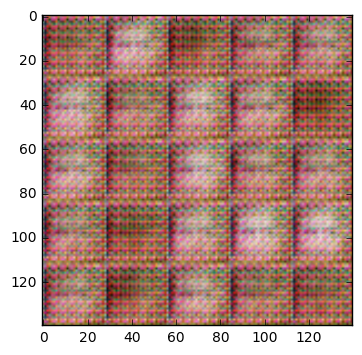

Epoch 1/1 Step 300... Discriminator Loss: 2.1224... Generator Loss: 0.2418 ... Time spent=1.0626
Epoch 1/1 Step 400... Discriminator Loss: 1.6449... Generator Loss: 0.3443 ... Time spent=1.0626


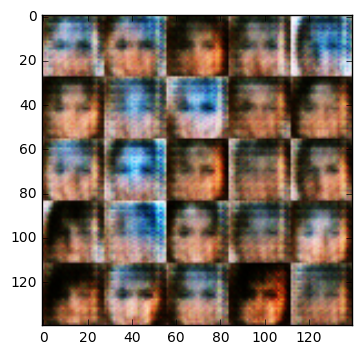

Epoch 1/1 Step 500... Discriminator Loss: 1.8534... Generator Loss: 0.2775 ... Time spent=1.1717
Epoch 1/1 Step 600... Discriminator Loss: 1.3554... Generator Loss: 0.8755 ... Time spent=1.0966


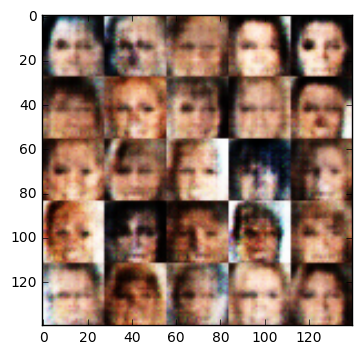

Epoch 1/1 Step 700... Discriminator Loss: 1.4029... Generator Loss: 0.8504 ... Time spent=1.0782
Epoch 1/1 Step 800... Discriminator Loss: 1.7490... Generator Loss: 0.3093 ... Time spent=1.2265


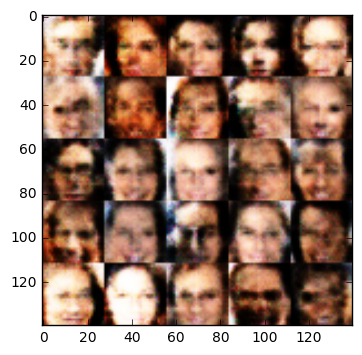

Epoch 1/1 Step 900... Discriminator Loss: 1.4134... Generator Loss: 1.2345 ... Time spent=1.0782
Epoch 1/1 Step 1000... Discriminator Loss: 1.2735... Generator Loss: 0.5299 ... Time spent=1.0854


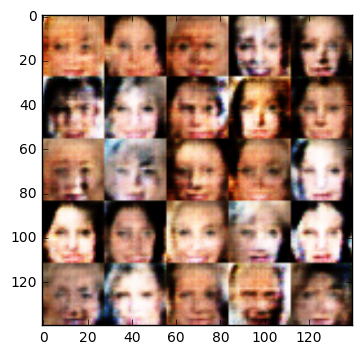

Epoch 1/1 Step 1100... Discriminator Loss: 0.8555... Generator Loss: 1.1695 ... Time spent=1.0939
Epoch 1/1 Step 1200... Discriminator Loss: 1.0701... Generator Loss: 1.6295 ... Time spent=1.0939


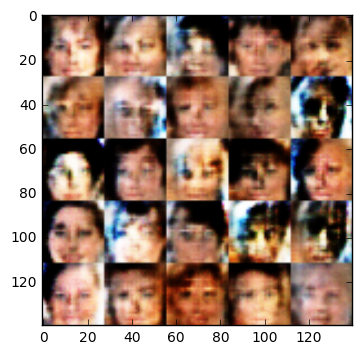

Epoch 1/1 Step 1300... Discriminator Loss: 1.4776... Generator Loss: 1.3592 ... Time spent=1.0939
Epoch 1/1 Step 1400... Discriminator Loss: 1.8607... Generator Loss: 2.1624 ... Time spent=1.0908


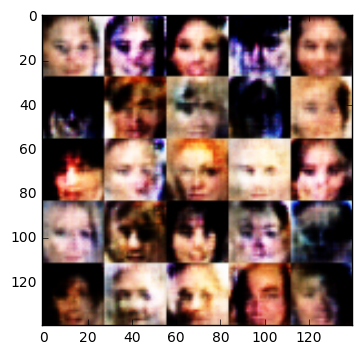

Epoch 1/1 Step 1500... Discriminator Loss: 1.1597... Generator Loss: 0.6647 ... Time spent=1.1251
Epoch 1/1 Step 1600... Discriminator Loss: 1.0331... Generator Loss: 1.2413 ... Time spent=1.1118


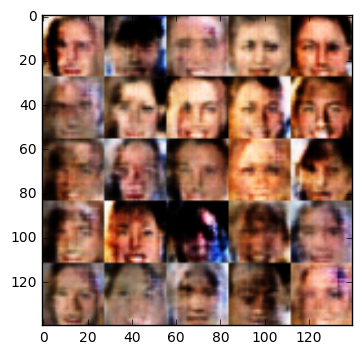

Epoch 1/1 Step 1700... Discriminator Loss: 0.9517... Generator Loss: 1.0846 ... Time spent=1.1020
Epoch 1/1 Step 1800... Discriminator Loss: 0.9389... Generator Loss: 1.1928 ... Time spent=1.0939


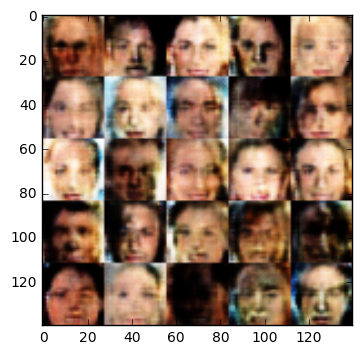

Epoch 1/1 Step 1900... Discriminator Loss: 0.9882... Generator Loss: 1.9697 ... Time spent=1.0939
Epoch 1/1 Step 2000... Discriminator Loss: 0.8097... Generator Loss: 1.3350 ... Time spent=1.0939


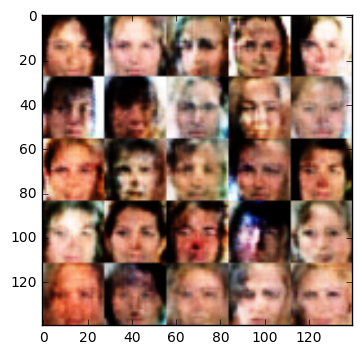

Epoch 1/1 Step 2100... Discriminator Loss: 1.0969... Generator Loss: 2.1108 ... Time spent=1.1564
Epoch 1/1 Step 2200... Discriminator Loss: 1.0354... Generator Loss: 0.7847 ... Time spent=1.0626


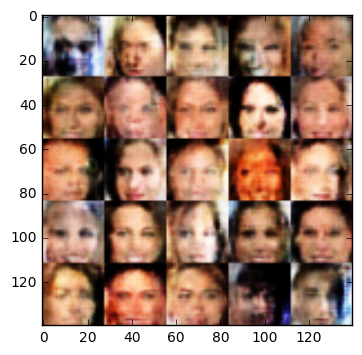

Epoch 1/1 Step 2300... Discriminator Loss: 0.8582... Generator Loss: 1.7021 ... Time spent=1.1095
Epoch 1/1 Step 2400... Discriminator Loss: 0.7759... Generator Loss: 1.6590 ... Time spent=1.1095


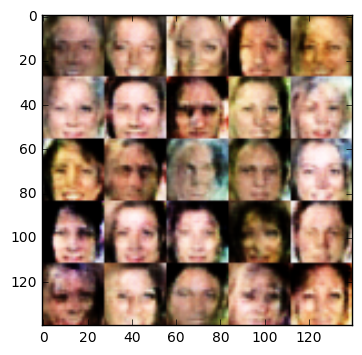

Epoch 1/1 Step 2500... Discriminator Loss: 1.0845... Generator Loss: 0.8666 ... Time spent=1.1031
Epoch 1/1 Step 2600... Discriminator Loss: 1.1272... Generator Loss: 1.2127 ... Time spent=1.0939


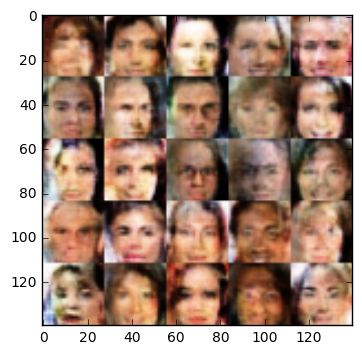

Epoch 1/1 Step 2700... Discriminator Loss: 0.8061... Generator Loss: 1.8336 ... Time spent=1.0782
Epoch 1/1 Step 2800... Discriminator Loss: 0.7719... Generator Loss: 1.6778 ... Time spent=1.0939


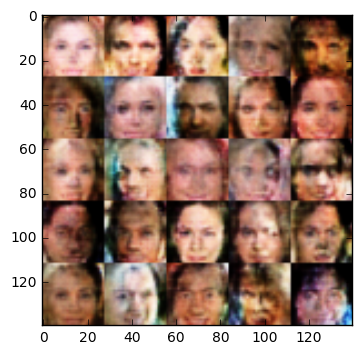

Epoch 1/1 Step 2900... Discriminator Loss: 0.7252... Generator Loss: 1.9815 ... Time spent=1.0939
Epoch 1/1 Step 3000... Discriminator Loss: 1.6903... Generator Loss: 0.4187 ... Time spent=1.0939


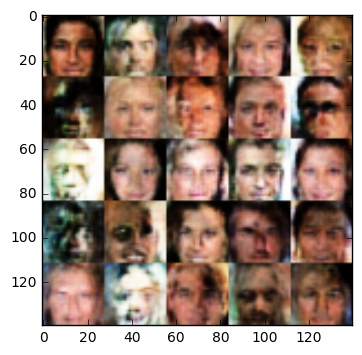

Epoch 1/1 Step 3100... Discriminator Loss: 1.5947... Generator Loss: 0.3758 ... Time spent=1.1407
Epoch 1/1 Step 3200... Discriminator Loss: 1.3373... Generator Loss: 0.5742 ... Time spent=1.1095


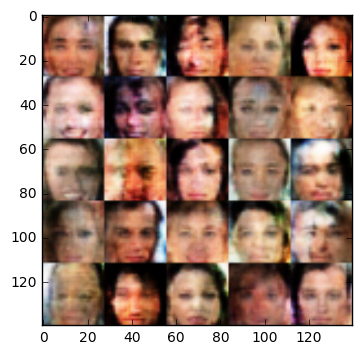

Epoch 1/1 Step 3300... Discriminator Loss: 0.8238... Generator Loss: 1.2639 ... Time spent=1.1036
Epoch 1/1 Step 3400... Discriminator Loss: 0.7969... Generator Loss: 1.8524 ... Time spent=1.2672


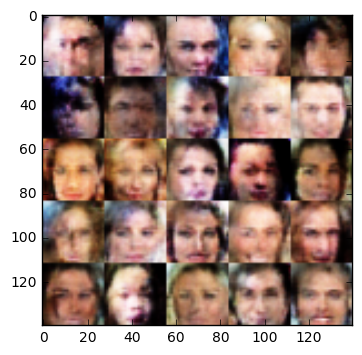

Epoch 1/1 Step 3500... Discriminator Loss: 0.7590... Generator Loss: 1.9528 ... Time spent=1.1095
Epoch 1/1 Step 3600... Discriminator Loss: 0.7549... Generator Loss: 2.3436 ... Time spent=1.1095


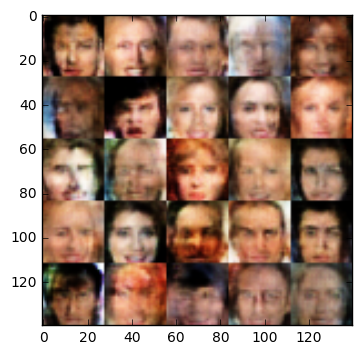

Epoch 1/1 Step 3700... Discriminator Loss: 0.7957... Generator Loss: 1.5506 ... Time spent=1.0782
Epoch 1/1 Step 3800... Discriminator Loss: 0.9093... Generator Loss: 1.4714 ... Time spent=1.0939


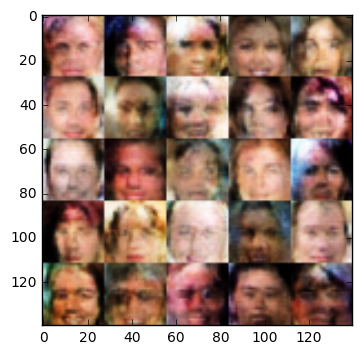

Epoch 1/1 Step 3900... Discriminator Loss: 0.9510... Generator Loss: 1.1541 ... Time spent=1.0939
Epoch 1/1 Step 4000... Discriminator Loss: 0.7654... Generator Loss: 1.6838 ... Time spent=1.0939


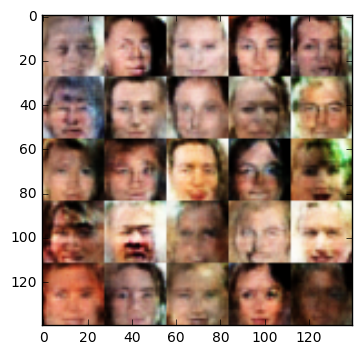

Epoch 1/1 Step 4100... Discriminator Loss: 0.7168... Generator Loss: 2.2567 ... Time spent=1.1443
Epoch 1/1 Step 4200... Discriminator Loss: 0.8586... Generator Loss: 2.5219 ... Time spent=1.1329


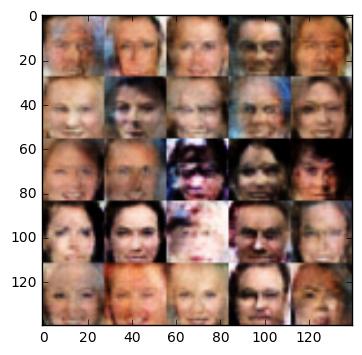

Epoch 1/1 Step 4300... Discriminator Loss: 1.0139... Generator Loss: 0.9424 ... Time spent=1.1358
Epoch 1/1 Step 4400... Discriminator Loss: 0.8141... Generator Loss: 1.6640 ... Time spent=1.1323


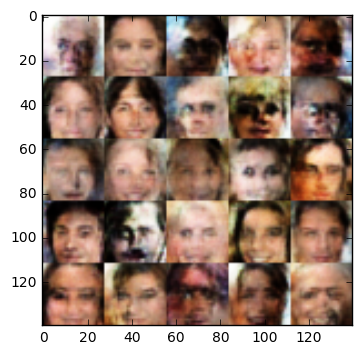

Epoch 1/1 Step 4500... Discriminator Loss: 0.8512... Generator Loss: 2.1542 ... Time spent=1.1720
Epoch 1/1 Step 4600... Discriminator Loss: 2.6473... Generator Loss: 2.3962 ... Time spent=1.1056


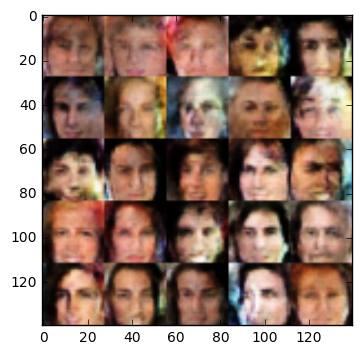

Epoch 1/1 Step 4700... Discriminator Loss: 0.7498... Generator Loss: 1.6855 ... Time spent=1.1931
Epoch 1/1 Step 4800... Discriminator Loss: 0.7139... Generator Loss: 2.0468 ... Time spent=1.1755


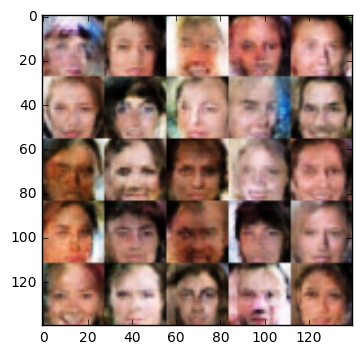

Epoch 1/1 Step 4900... Discriminator Loss: 0.7412... Generator Loss: 1.8205 ... Time spent=1.1684
Epoch 1/1 Step 5000... Discriminator Loss: 0.8266... Generator Loss: 1.2462 ... Time spent=1.1141


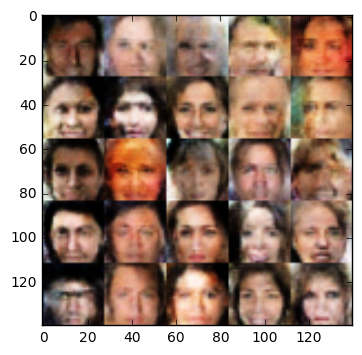

Epoch 1/1 Step 5100... Discriminator Loss: 0.7394... Generator Loss: 1.7219 ... Time spent=1.0480
Epoch 1/1 Step 5200... Discriminator Loss: 0.7772... Generator Loss: 1.5523 ... Time spent=1.0641


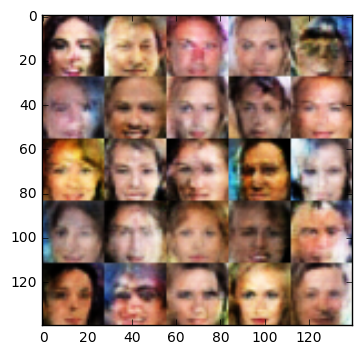

Epoch 1/1 Step 5300... Discriminator Loss: 0.8902... Generator Loss: 1.2038 ... Time spent=1.0470
Epoch 1/1 Step 5400... Discriminator Loss: 0.7463... Generator Loss: 2.4769 ... Time spent=1.1596


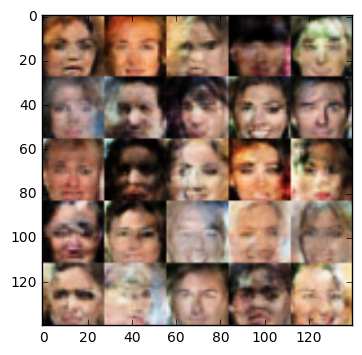

Epoch 1/1 Step 5500... Discriminator Loss: 0.7172... Generator Loss: 1.9541 ... Time spent=1.0782
Epoch 1/1 Step 5600... Discriminator Loss: 0.7144... Generator Loss: 2.3465 ... Time spent=1.0652


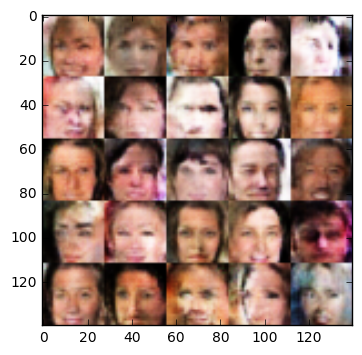

Epoch 1/1 Step 5700... Discriminator Loss: 0.7856... Generator Loss: 2.2434 ... Time spent=1.1068
Epoch 1/1 Step 5800... Discriminator Loss: 0.7237... Generator Loss: 1.8896 ... Time spent=1.0782


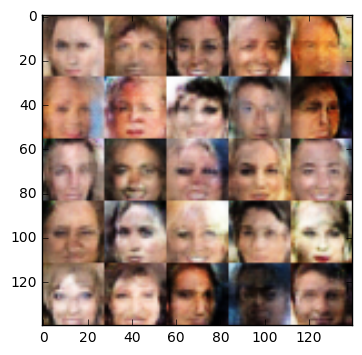

Epoch 1/1 Step 5900... Discriminator Loss: 0.7284... Generator Loss: 1.9650 ... Time spent=1.1884
Epoch 1/1 Step 6000... Discriminator Loss: 0.7232... Generator Loss: 2.5382 ... Time spent=1.1282


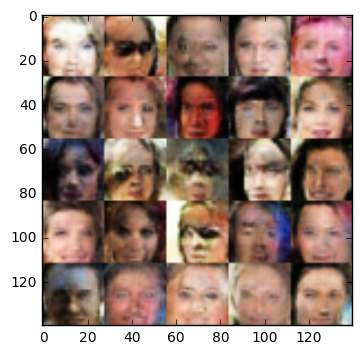

Epoch 1/1 Step 6100... Discriminator Loss: 0.7426... Generator Loss: 1.6516 ... Time spent=1.1095
Epoch 1/1 Step 6200... Discriminator Loss: 0.9781... Generator Loss: 0.9829 ... Time spent=1.0626


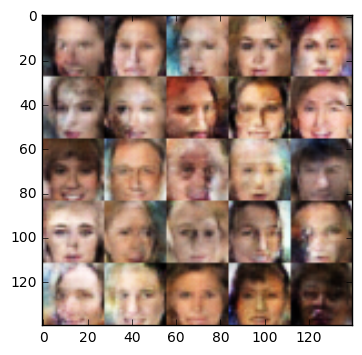

Epoch 1/1 Step 6300... Discriminator Loss: 1.1244... Generator Loss: 2.4659 ... Time spent=1.0939
Epoch 1/1 Step 6400... Discriminator Loss: 0.9216... Generator Loss: 1.2862 ... Time spent=1.0782


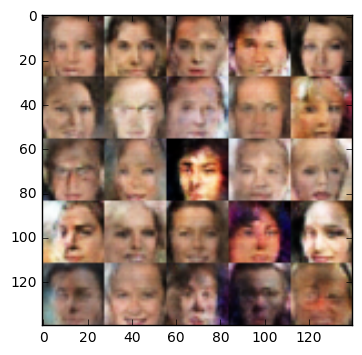

Epoch 1/1 Step 6500... Discriminator Loss: 0.7187... Generator Loss: 2.0534 ... Time spent=1.1277
Epoch 1/1 Step 6600... Discriminator Loss: 0.7888... Generator Loss: 1.3742 ... Time spent=1.0938


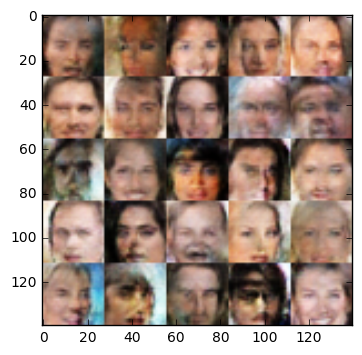

Epoch 1/1 Step 6700... Discriminator Loss: 0.7264... Generator Loss: 1.8816 ... Time spent=1.0939
Epoch 1/1 Step 6800... Discriminator Loss: 1.1752... Generator Loss: 0.8385 ... Time spent=1.1095


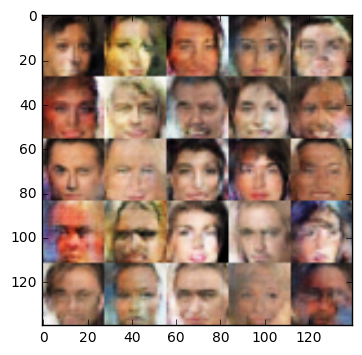

Epoch 1/1 Step 6900... Discriminator Loss: 0.8956... Generator Loss: 1.0944 ... Time spent=1.1094
Epoch 1/1 Step 7000... Discriminator Loss: 0.7406... Generator Loss: 1.9248 ... Time spent=1.0782


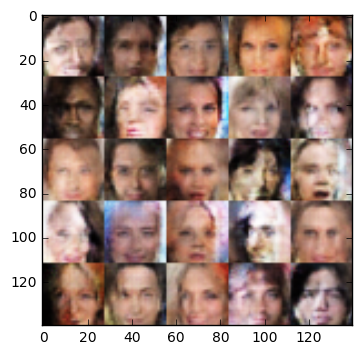

Epoch 1/1 Step 7100... Discriminator Loss: 0.8656... Generator Loss: 1.3847 ... Time spent=1.1095
Epoch 1/1 Step 7200... Discriminator Loss: 0.7836... Generator Loss: 2.2437 ... Time spent=1.1311


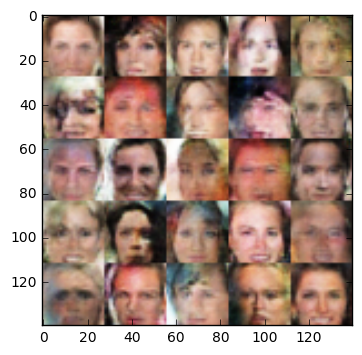

Epoch 1/1 Step 7300... Discriminator Loss: 0.8411... Generator Loss: 1.3825 ... Time spent=1.0938
Epoch 1/1 Step 7400... Discriminator Loss: 0.7437... Generator Loss: 1.8001 ... Time spent=1.1095


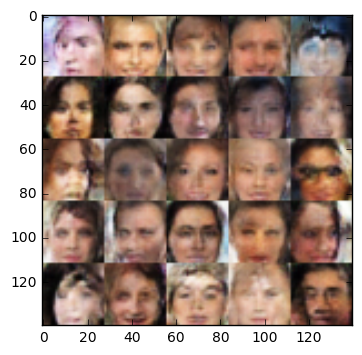

Epoch 1/1 Step 7500... Discriminator Loss: 0.7694... Generator Loss: 1.5599 ... Time spent=1.0939
Epoch 1/1 Step 7600... Discriminator Loss: 0.7640... Generator Loss: 1.4931 ... Time spent=1.1250


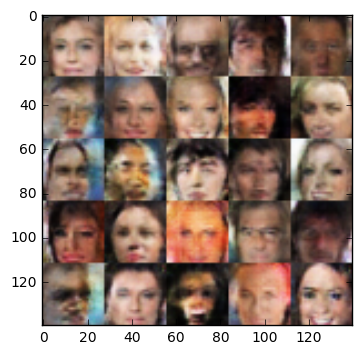

Epoch 1/1 Step 7700... Discriminator Loss: 0.7638... Generator Loss: 1.8924 ... Time spent=1.0939
Epoch 1/1 Step 7800... Discriminator Loss: 0.7915... Generator Loss: 1.4100 ... Time spent=1.0939


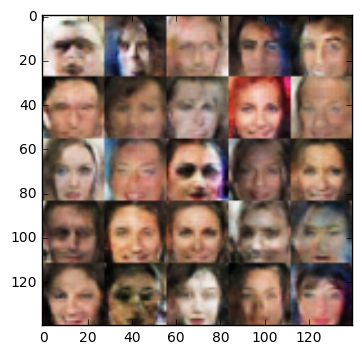

Epoch 1/1 Step 7900... Discriminator Loss: 0.7816... Generator Loss: 2.0440 ... Time spent=1.0783
Epoch 1/1 Step 8000... Discriminator Loss: 0.8369... Generator Loss: 1.6717 ... Time spent=1.1095


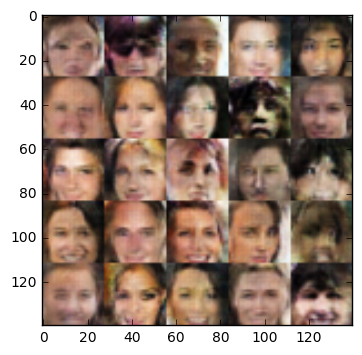

Epoch 1/1 Step 8100... Discriminator Loss: 0.7304... Generator Loss: 1.8515 ... Time spent=1.1408
Epoch 1/1 Step 8200... Discriminator Loss: 0.7306... Generator Loss: 2.3654 ... Time spent=1.0782


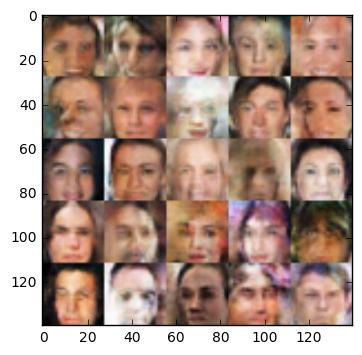

Epoch 1/1 Step 8300... Discriminator Loss: 0.7257... Generator Loss: 1.8749 ... Time spent=1.0993
Epoch 1/1 Step 8400... Discriminator Loss: 0.7507... Generator Loss: 1.7028 ... Time spent=1.1012


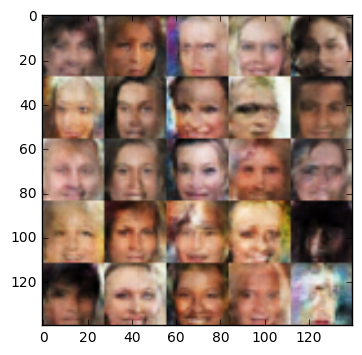

Epoch 1/1 Step 8500... Discriminator Loss: 0.7421... Generator Loss: 1.6921 ... Time spent=1.0782
Epoch 1/1 Step 8600... Discriminator Loss: 0.7739... Generator Loss: 1.5534 ... Time spent=1.0938


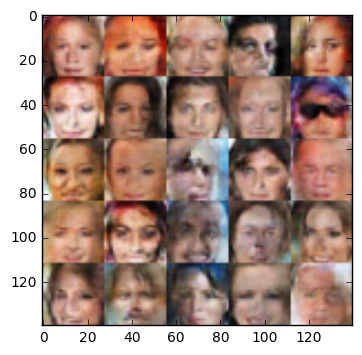

Epoch 1/1 Step 8700... Discriminator Loss: 0.7317... Generator Loss: 2.0322 ... Time spent=1.1168
Epoch 1/1 Step 8800... Discriminator Loss: 0.7193... Generator Loss: 2.4082 ... Time spent=1.1251


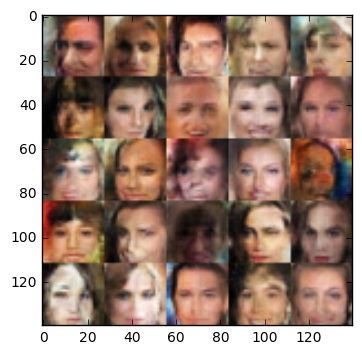

Epoch 1/1 Step 8900... Discriminator Loss: 0.9328... Generator Loss: 1.0672 ... Time spent=1.1085
Epoch 1/1 Step 9000... Discriminator Loss: 0.9739... Generator Loss: 0.9305 ... Time spent=1.3246


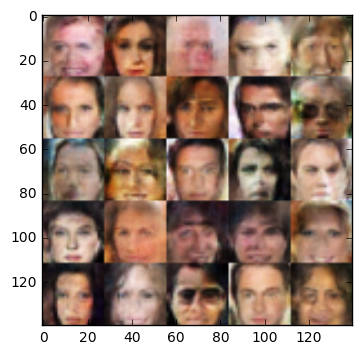

Epoch 1/1 Step 9100... Discriminator Loss: 0.9398... Generator Loss: 3.0145 ... Time spent=1.2032
Epoch 1/1 Step 9200... Discriminator Loss: 0.8528... Generator Loss: 1.2854 ... Time spent=1.0965


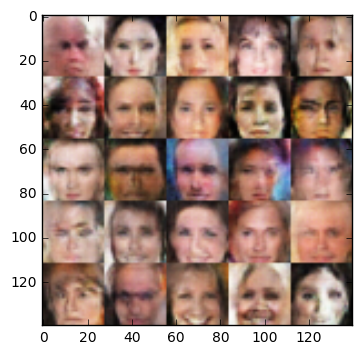

Epoch 1/1 Step 9300... Discriminator Loss: 0.8161... Generator Loss: 1.7403 ... Time spent=1.0937
Epoch 1/1 Step 9400... Discriminator Loss: 0.8189... Generator Loss: 1.3724 ... Time spent=1.1095


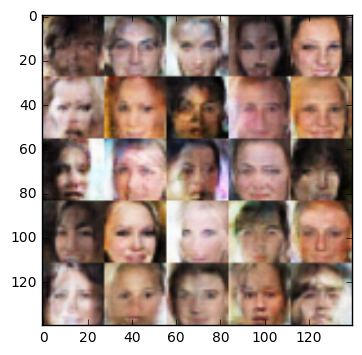

Epoch 1/1 Step 9500... Discriminator Loss: 0.6966... Generator Loss: 2.2969 ... Time spent=1.1095
Epoch 1/1 Step 9600... Discriminator Loss: 0.7744... Generator Loss: 1.4576 ... Time spent=1.0782


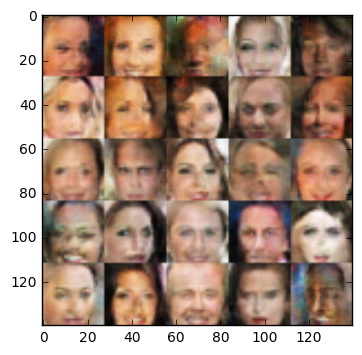

Epoch 1/1 Step 9700... Discriminator Loss: 0.7170... Generator Loss: 2.1862 ... Time spent=1.0939
Epoch 1/1 Step 9800... Discriminator Loss: 0.7772... Generator Loss: 2.8652 ... Time spent=1.0782


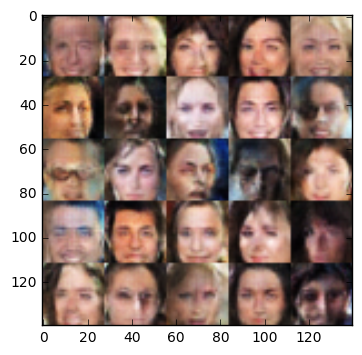

Epoch 1/1 Step 9900... Discriminator Loss: 0.6945... Generator Loss: 2.3585 ... Time spent=1.0939
Epoch 1/1 Step 10000... Discriminator Loss: 0.8848... Generator Loss: 1.1098 ... Time spent=1.0782


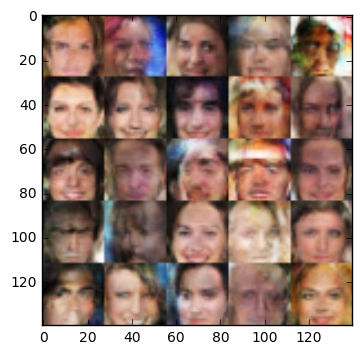

Epoch 1/1 Step 10100... Discriminator Loss: 0.8261... Generator Loss: 1.9920 ... Time spent=1.0782
Epoch 1/1 Step 10200... Discriminator Loss: 2.6130... Generator Loss: 0.2252 ... Time spent=1.0939


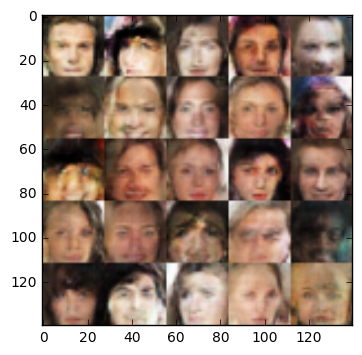

Epoch 1/1 Step 10300... Discriminator Loss: 1.4205... Generator Loss: 0.5202 ... Time spent=1.1095
Epoch 1/1 Step 10400... Discriminator Loss: 0.7379... Generator Loss: 2.8484 ... Time spent=1.1505


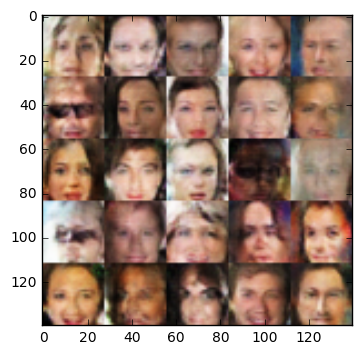

Epoch 1/1 Step 10500... Discriminator Loss: 1.0484... Generator Loss: 1.8018 ... Time spent=1.0939
Epoch 1/1 Step 10600... Discriminator Loss: 0.7254... Generator Loss: 2.2274 ... Time spent=1.0939


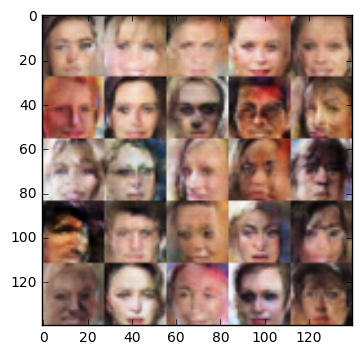

Epoch 1/1 Step 10700... Discriminator Loss: 1.0225... Generator Loss: 1.9409 ... Time spent=1.1088
Epoch 1/1 Step 10800... Discriminator Loss: 0.8866... Generator Loss: 1.2703 ... Time spent=1.0782


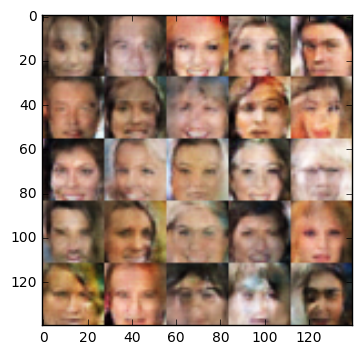

Epoch 1/1 Step 10900... Discriminator Loss: 0.7909... Generator Loss: 1.8170 ... Time spent=1.0939
Epoch 1/1 Step 11000... Discriminator Loss: 0.8926... Generator Loss: 1.3883 ... Time spent=1.1095


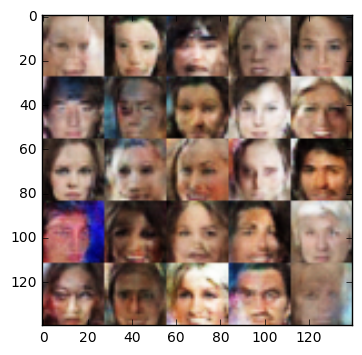

Epoch 1/1 Step 11100... Discriminator Loss: 0.7201... Generator Loss: 1.8773 ... Time spent=1.1206
Epoch 1/1 Step 11200... Discriminator Loss: 0.7758... Generator Loss: 1.6806 ... Time spent=1.1095


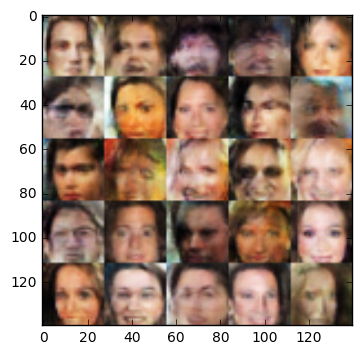

Epoch 1/1 Step 11300... Discriminator Loss: 0.7276... Generator Loss: 1.9620 ... Time spent=1.0905
Epoch 1/1 Step 11400... Discriminator Loss: 0.7308... Generator Loss: 2.3679 ... Time spent=1.0939


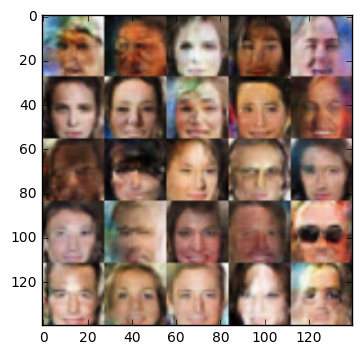

Epoch 1/1 Step 11500... Discriminator Loss: 0.7333... Generator Loss: 1.9377 ... Time spent=1.0782
Epoch 1/1 Step 11600... Discriminator Loss: 0.7037... Generator Loss: 2.4454 ... Time spent=1.0939


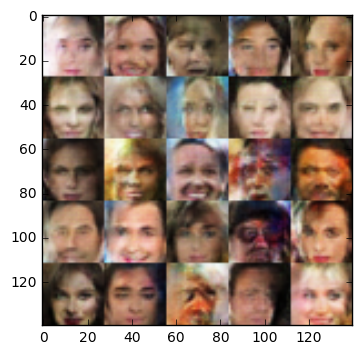

Epoch 1/1 Step 11700... Discriminator Loss: 0.8633... Generator Loss: 1.2223 ... Time spent=1.0994
Epoch 1/1 Step 11800... Discriminator Loss: 0.7587... Generator Loss: 1.6128 ... Time spent=1.0782


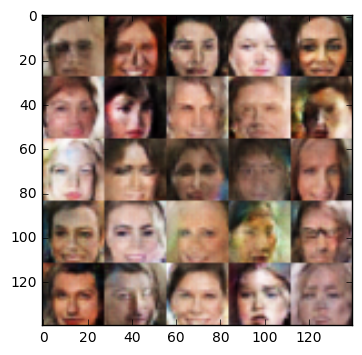

Epoch 1/1 Step 11900... Discriminator Loss: 0.8465... Generator Loss: 1.3792 ... Time spent=1.0939
Epoch 1/1 Step 12000... Discriminator Loss: 0.8528... Generator Loss: 1.5893 ... Time spent=1.0987


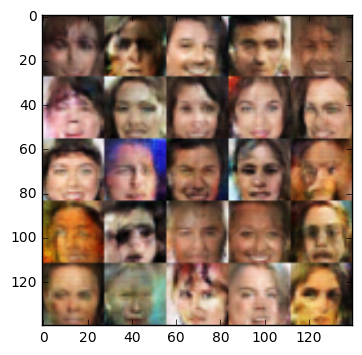

Epoch 1/1 Step 12100... Discriminator Loss: 0.7480... Generator Loss: 1.9776 ... Time spent=1.4728
Epoch 1/1 Step 12200... Discriminator Loss: 0.7363... Generator Loss: 1.8909 ... Time spent=1.0729


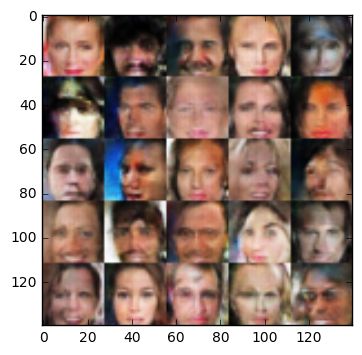

Epoch 1/1 Step 12300... Discriminator Loss: 0.8070... Generator Loss: 2.2443 ... Time spent=1.1089
Epoch 1/1 Step 12400... Discriminator Loss: 0.9981... Generator Loss: 0.9412 ... Time spent=1.1330


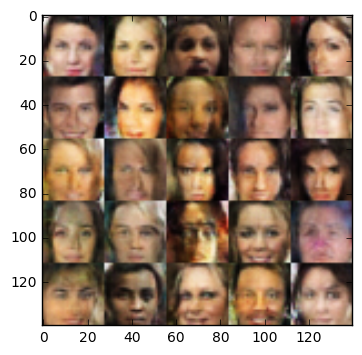

Epoch 1/1 Step 12500... Discriminator Loss: 1.0276... Generator Loss: 2.0404 ... Time spent=1.0782
Epoch 1/1 Step 12600... Discriminator Loss: 0.7706... Generator Loss: 1.5029 ... Time spent=1.2583


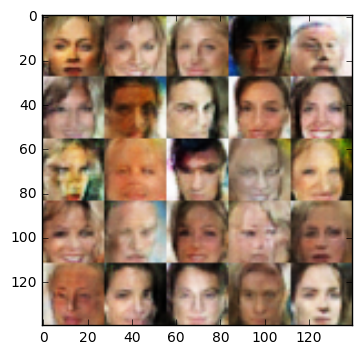

In [29]:
batch_size = 16
z_dim = 100
learning_rate = 0.0004
beta1 = 0.2

epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)